# Spotify Music Data Analysis and Recommendation System

### Import Libraries and Data Set 

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager

from datetime import datetime


%matplotlib inline

In [3]:
df = pd.read_csv("../datasets/data_cleaned.csv", parse_dates=['release_date'], index_col=['release_date'])
df.head()

,acousticness,artists,danceability,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,valence,year,duration_mins
release_date,,,,,,,,,,,,,,,,,,
1920-01-01,0.991000,['Mamie Smith'],0.598,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,0.12,0.0936,149.976,0.6340,1920,2.81
1920-01-05,0.643000,"[""Screamin' Jay Hawkins""]",0.852,0.517,0,0hbkKFIJm7Z05H8Zl9w30f,0.026400,5,0.0809,-7.261,0,I Put A Spell On You,0.07,0.0534,86.889,0.9500,1920,2.50
1920-01-01,0.993000,['Mamie Smith'],0.647,0.186,0,11m7laMUgmOKqI3oYzuhne,0.000018,0,0.5190,-12.098,1,Golfing Papa,0.04,0.1740,97.600,0.6890,1920,2.73
1920-01-01,0.000173,['Oscar Velazquez'],0.730,0.798,0,19Lc5SfJJ5O1oaxY0fpwfh,0.801000,2,0.1280,-7.311,1,True House Music - Xavier Santos & Carlos Gomi...,0.17,0.0425,127.997,0.0422,1920,7.03
1920-10-01,0.295000,['Mixe'],0.704,0.707,1,2hJjbsLCytGsnAHfdsLejp,0.000246,10,0.4020,-6.036,0,Xuniverxe,0.02,0.0768,122.076,0.2990,1920,2.75


In [4]:
df.shape

(159477, 18)

# 3. Exploratory Data Analysis

### Correlation Heatmap

In [5]:
plt.style.use('dark_background')

plt.rcParams.update({
    "lines.color": '#1DB954',
    "patch.edgecolor": "white",
    "text.color": "black",
    "axes.edgecolor": "lightgray",
    "axes.labelcolor": "white",
    "xtick.color": "white",
    "ytick.color": "white",
    "grid.color": "lightgray",
    "figure.facecolor": "black",
    "figure.edgecolor": "black",
    "savefig.facecolor": "black",
    "savefig.edgecolor": "black",
    "font.family": "Calibri"})

In [6]:
numerical_variables = ['popularity', 'acousticness', 'danceability', 'duration_mins', 'energy', 'instrumentalness', 'key', 
                       'mode', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'year']

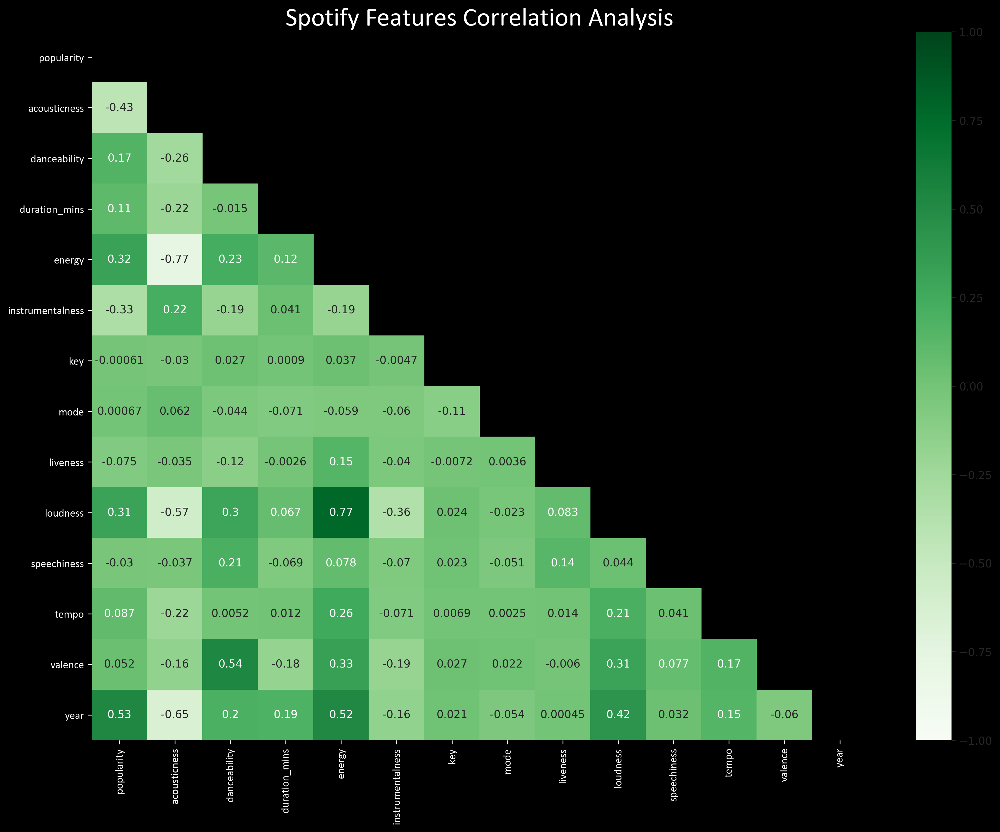

In [7]:
plt.figure(figsize=(16,12), dpi=300)
plt.title("Spotify Features Correlation Analysis", fontsize=24, c='w')

matrix = np.triu(df[numerical_variables].corr())

with sns.axes_style("white"):
    sns.heatmap(df[numerical_variables].corr(), vmin=-1, vmax=1, center=0, linecolor='black', cmap='Greens', annot=True, mask=matrix)
    
plt.show()

#### Correlation Heatmap Observations & Analysis

The features with the highest correlation to the popularity are: 
- Year (0.51)
- Loudness (0.34)
- Energy (0.33) 
- Danceability (0.12) 

Since the popularity metric is mainly based on the total number of plays the track has had and how recent those plays were, it makes sense that newer songs tend to be played more frequently among Spotify users. Furthermore the <a href ="https://www.musicbusinessworldwide.com/stat-of-the-week-people-over-45-not-millennials-are-driving-music-subscription-growth-in-the-uk/">demographics</a> of Spotify users (50-60% of users aged 34 years and below) suggest there would be a higher preference for listening to songs of their generation, as opposed to songs released before the 1980s. 

Some correlation is observed between louder and more energetic songs, and popularity. This requires further exploring the other correlations in the heatmap: 
- Loudness and energy have a strong positive correlation with each other (0.78), 
- Both loudness and energy have a sizeable correlation with year (0.47 and 0.54 respectively) 
This suggests that newer songs tend to be louder and more energetic, and songs of this nature tend to be more popular with users. On a deeper level, it also highlights how music has evolved over the decades to be more upbeat and how songs now have higher audio quality. 

Other interesting correlations include: 
- Acousticness vs Energy (-0.75), Year (-0.61), Loudness (-0.55), Danceability (-0.26), Tempo (-0.22), Instrumentalness (0.22), Popularity (0.40)

Acoustic means 'without electrical amplification', so higher acoustic levels are associated with the use of acoustic guitars and pianos, instead of electric guitars and keyboards. These songs are typically slower (as observed by the negative correlation with tempo) and lower in energy / loudness levels. However, the positive correlation with popularity (0.40) shows that these songs do cater to listeners who may have a preference for instrumentals or soothing music. 

- Valence vs Danceability (0.54), Energy (0.33), Loudness (0.3)

Valence uses other measures like key and tempo to determine whether a song has positive or negative emotions. Higher valence scores are generally associated with songs which are more 'dance-worthy', energetic and loud. We do note that there is no clear correlation between valence and popularity, suggesting that the popularity of a song is not necessarily dependent on how happy it sounds. 
 

## 3.1 Continuous Variables

### 3.1.1 Popularity Distribution 

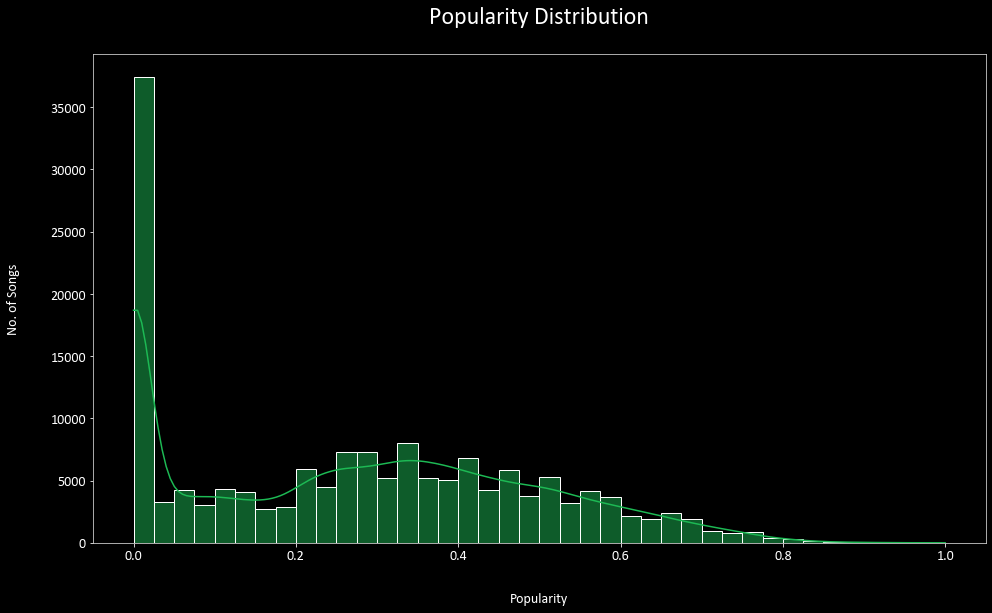

In [8]:
plt.figure(figsize=(16,9))

sns.histplot(df['popularity'], bins=40, kde=True,color='#1DB954')
plt.xlabel('Popularity', fontsize=14, labelpad=30)
plt.ylabel('No. of Songs', fontsize=14, labelpad=30)
plt.tick_params(labelsize=14)
plt.title("Popularity Distribution", fontsize=24, c='w', pad=30)

plt.show()

From the above graph, we see that the vast majority of songs have a popularity rating of 0. This is largely due to the way Spotify's algorithm calculates the song popularity rating which "is based, in the most part, on the total number of plays the track has had and how recent those plays are" (<a href="https://developer.spotify.com/documentation/web-api/reference/#objects-index">source</a>). 

Thus, songs being played a lot now would have a higher popularity compared to songs that were played a lot in the past. This is explored in the charts below. Given that the majority of Spotify users are below the age of 34, we do expect to see more popular songs in the years after 1990. 

In [9]:
df[df['popularity'] >= 0.7]['year'].value_counts().sort_values(ascending=False).head(30)

2020    845
2019    528
2018    455
2017    361
2016    184
2015    176
2013    106
2014    101
2012     89
2011     79
2010     67
2021     59
2007     57
2008     54
2006     54
2005     48
2004     48
2009     44
2002     42
2000     40
1999     39
2001     37
1994     32
2003     30
1997     29
1984     28
1991     26
1993     22
1996     22
1977     21
Name: year, dtype: int64

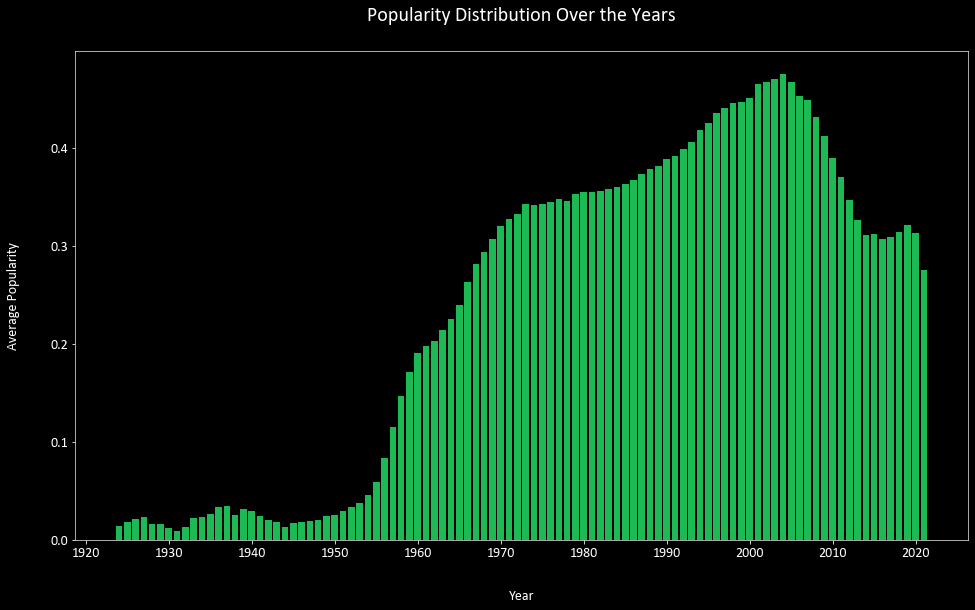

In [10]:
plt.figure(figsize=(16,9))

plt.bar(x=df.groupby('year').mean()['popularity'].index, height=df.groupby('year').mean()['popularity'].rolling(5).mean(), color='#1DB954')
plt.xlabel('Year', fontsize=14, labelpad=30)
plt.ylabel('Average Popularity', fontsize=14, labelpad=30)
plt.tick_params(labelsize=14)
plt.title("Popularity Distribution Over the Years", fontsize=20, c='w', pad=30)
plt.xticks(np.arange(1920, 2030, step=10))

plt.show()

View by decade

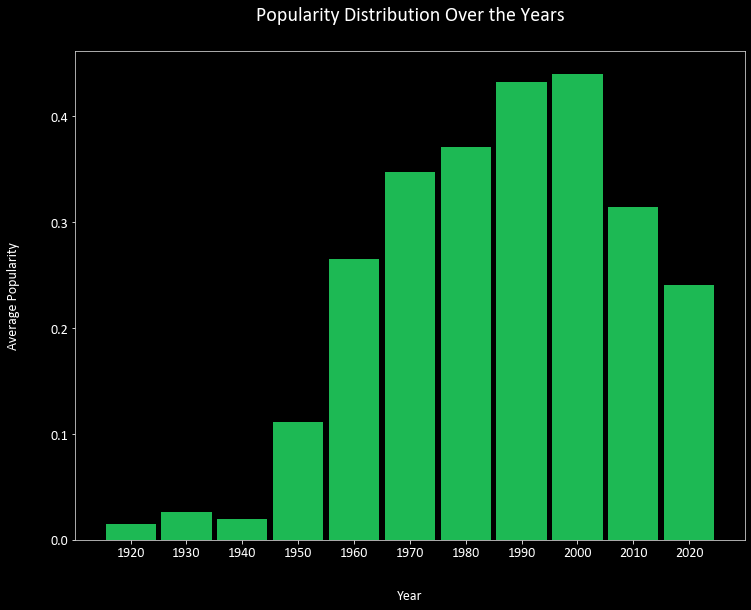

In [11]:
plt.figure(figsize=(12,9))

plt.bar(x=df.resample('10AS').mean()['popularity'].index.year, height=df.resample('10AS').mean()['popularity'].values, color='#1DB954', width=9)
plt.xlabel('Year', fontsize=14, labelpad=30)
plt.ylabel('Average Popularity', fontsize=14, labelpad=30)
plt.tick_params(labelsize=14)
plt.title("Popularity Distribution Over the Years", fontsize=20, c='w', pad=30)
plt.xticks(np.arange(1920, 2030, step=10))
plt.show()



As expected, songs in the 1990s and 2000s have the highest popularity ratings, indicating that songs released in these eras have been played the most, and have been played recently. 

### 3.1.2 Songs Released by Year

In [12]:
df['year'].value_counts().head()

2020    3547
2018    2485
2013    2287
2016    2158
2019    2146
Name: year, dtype: int64

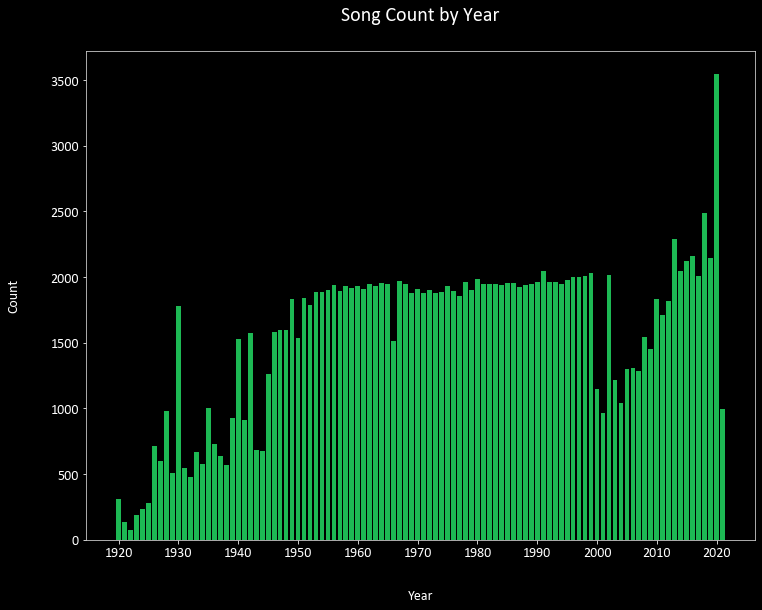

In [13]:
plt.figure(figsize=(12,9))
ax = plt.axes()
# ax.set_facecolor('#191414')

plt.bar(x=df['year'].value_counts().index, height=df['year'].value_counts().values, color='#1DB954')
plt.xlabel('Year', fontsize=14, labelpad=30)
plt.ylabel('Count', fontsize=14, labelpad=30)
plt.tick_params(labelsize=14)
plt.title("Song Count by Year", fontsize=20, pad=30, c='w')
plt.xticks(np.arange(1920, 2030, step=10))

plt.show()

##### Songs released by decade

In [14]:
df.resample('10AS').count()['artists'].values

array([ 4020,  7921, 13244, 18528, 18931, 19011, 19495, 19893, 13279,
       20613,  4542], dtype=int64)

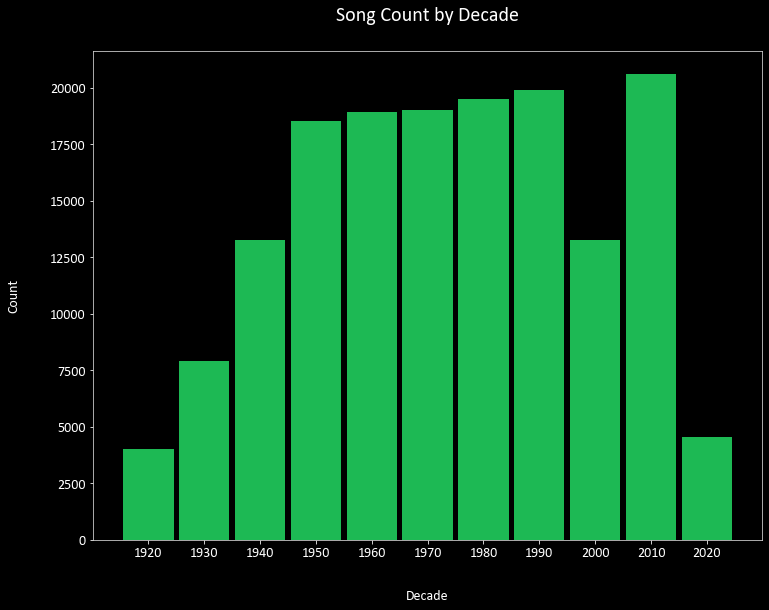

In [15]:
plt.figure(figsize=(12,9))

plt.bar(x=df.resample('10AS').count().index.year, height=df.resample('10AS').count()['artists'].values, width=9, color='#1DB954')
plt.xlabel('Decade', fontsize=14, labelpad=30)
plt.ylabel('Count', fontsize=14, labelpad=30)
plt.tick_params(labelsize=14)
plt.title("Song Count by Decade", fontsize=20, pad=30, c='w')
plt.xticks(np.arange(1920, 2030, step=10))

plt.show()

Decades with the highest number of songs in the dataset are 2010, followed by 1950, 1960, 1970, 1980 and 1990. 

### 3.1.3 Musical Features by Decade

In [16]:
df_YA = df[['acousticness', 'danceability','energy', 'instrumentalness', 'liveness', 'speechiness', 'valence','year']].groupby('year').mean().sort_values('year')
df_YA.tail()

,acousticness,danceability,energy,instrumentalness,liveness,speechiness,valence
year,,,,,,,
2017,0.198505,0.585950,0.684472,0.231327,0.229536,0.097285,0.440281
2018,0.217843,0.602869,0.663307,0.224599,0.226036,0.109671,0.426094
2019,0.264137,0.608068,0.629241,0.206835,0.216441,0.106582,0.462565
2020,0.200695,0.604017,0.676469,0.239464,0.240797,0.099968,0.455879
2021,0.341746,0.632948,0.577063,0.365269,0.169539,0.103539,0.417048


In [17]:
df_10_YA = df_YA.rolling(10).mean()
df_10_YA

,acousticness,danceability,energy,instrumentalness,liveness,speechiness,valence
year,,,,,,,
1920,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1921,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1922,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1923,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1924,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2017,0.232048,0.578838,0.666485,0.197262,0.214720,0.085104,0.477369
2018,0.226103,0.582709,0.664958,0.208684,0.214320,0.088759,0.463970
2019,0.228093,0.587012,0.658514,0.215091,0.215544,0.091953,0.456527


In [21]:
cont_features = ['acousticness', 'danceability','energy', 'instrumentalness', 'liveness', 'speechiness', 'valence']

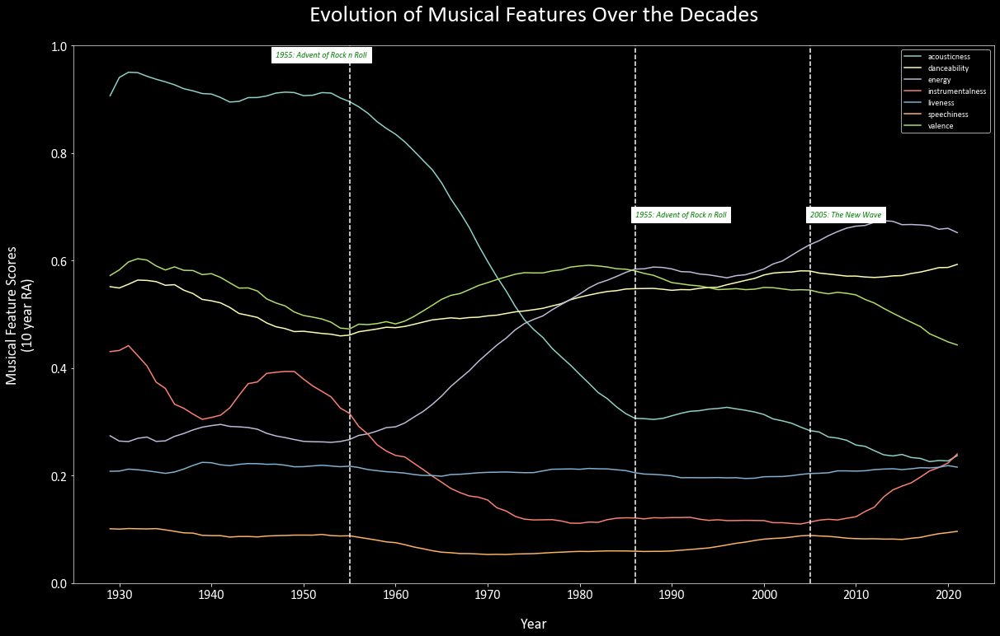

In [22]:
plt.figure(figsize=(20,12))

for feature in cont_features: 
    ax = sns.lineplot(x=df_10_YA.index, y=feature, data=df_10_YA, label=feature)
    legend = plt.legend()
    plt.setp(legend.get_texts(), color='w')

plt.title("Evolution of Musical Features Over the Decades", c='white', fontsize=28, pad=30)
plt.ylabel("Musical Feature Scores\n(10 year RA)", fontsize=18, labelpad=20)
plt.xlabel("Year", fontsize=18, labelpad=20)           
plt.tick_params(labelsize=16)
plt.xticks(np.arange(1920, 2030, step=10))

plt.xlim([1925, 2025])
plt.ylim([0,1])

plt.axvline(x=1955, color='grey', linestyle='--', c='w')
plt.text(1947, 0.979, '1955: Advent of Rock n Roll', c='g', style='italic', bbox={'facecolor': 'white', 'alpha': 1, 'pad': 5})

plt.axvline(x=1986, color='grey', linestyle='--', c='w')
plt.text(1986, 0.682, '1955: Advent of Rock n Roll', c='g', style='italic', bbox={'facecolor': 'white', 'alpha': 1, 'pad': 5})

plt.axvline(x=2005, color='grey', linestyle='--', c='w')
plt.text(2005, 0.682, '2005: The New Wave', c='g', style='italic', bbox={'facecolor': 'white', 'alpha': 1, 'pad': 5})

plt.show()

Several interesting observations from the plot above: 



- From the 1950s, the upward trend of energy and and danceability has been matched by the downward movement of acousticness. This makes sense as the songs which are more energetic and danceable tend to be of rock and roll or electronic dance music genres, both of which heavily utilise instruments that produce sounds electronically (eg. electric guitar)  

- To understand why this happened requires an understanding of how music was evolving during the 1950s. Rock 'n' roll was starting to pick up with <a href="https://www.aimm.edu/blog/evolution-of-music-from-the-1950s-to-the-2000s">Elvis Presley</a> becoming one of the most prominent faces in that genre. This partly helped along by massive improvements in <a href="https://www.asme.org/topics-resources/content/top-10-technology-innovations-got-rock-rolling">music technology</a> where electric bass guitars, transistor radios and upgraded microphones (among several other intruments</a>) set the standards for the music industry. 
- One factor contributing to the evolution of music technology was the <a href="https://www.britannica.com/art/electronic-instrument/Post-World-War-II-electronic-instruments">advances in electronic technology during World War II</a> which was then applied to electronic musical instruments. 

- Valence: Generally consistent over the years although there seems to be a decline from the early 2000s, reflecting the growth of 'emo' music. 

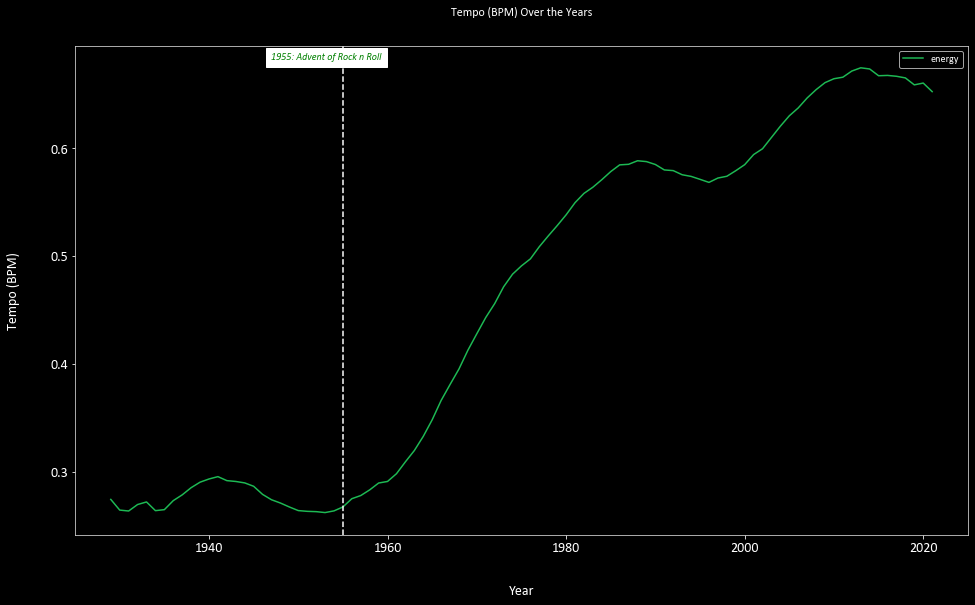

In [27]:
plt.figure(figsize=(16,9))

sns.lineplot(x=df.groupby('year').mean()['energy'].index, y=df.groupby('year').mean()['energy'].rolling(10).mean().values, label='energy', color='#1DB954')
legend = plt.legend()
plt.setp(legend.get_texts(), color='w')

plt.title("Tempo (BPM) Over the Years", color='w', pad=30)
plt.ylabel("Tempo (BPM)", fontsize=14, labelpad=30)
plt.xlabel("Year", fontsize=14, labelpad=30)           
plt.tick_params(labelsize=14)

plt.axvline(x=1955, color='grey', linestyle='--', c='w')
plt.text(1947, 0.682, '1955: Advent of Rock n Roll', c='g', style='italic', bbox={'facecolor': 'white', 'alpha': 1, 'pad': 5})

plt.xlim([1925, 2025])
# plt.ylim([0,1])

plt.show()

### 3.1.4 Tempo (BPM)

In [28]:
df.groupby('year').mean()['tempo'].rolling(5).mean()

year
1920           NaN
1921           NaN
1922           NaN
1923           NaN
1924    110.889263
           ...    
2017    123.089609
2018    123.118496
2019    122.634853
2020    123.255418
2021    122.713266
Name: tempo, Length: 102, dtype: float64

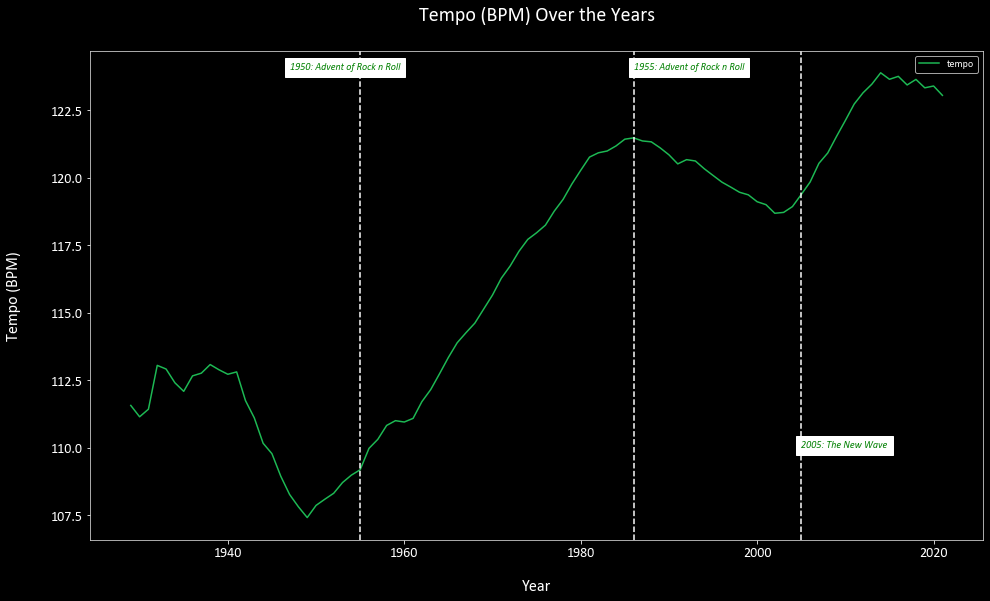

In [29]:
plt.figure(figsize=(16,9))

sns.lineplot(x=df.groupby('year').mean()['tempo'].index, y=df.groupby('year').mean()['tempo'].rolling(10).mean().values, label='tempo', color='#1DB954')
legend = plt.legend()
plt.setp(legend.get_texts(), color='w')

plt.title("Tempo (BPM) Over the Years", color='w', pad=30, fontsize=20)
plt.ylabel("Tempo (BPM)", fontsize=16, labelpad=30)
plt.xlabel("Year", fontsize=16, labelpad=20)           
plt.tick_params(labelsize=14)

plt.axvline(x=1955, color='grey', linestyle='--', c='w')
plt.text(1947, 124, '1950: Advent of Rock n Roll', c='g', style='italic', bbox={'facecolor': 'white', 'alpha': 1, 'pad': 5})

plt.axvline(x=1986, color='grey', linestyle='--', c='w')
plt.text(1986, 124, '1955: Advent of Rock n Roll', c='g', style='italic', bbox={'facecolor': 'white', 'alpha': 1, 'pad': 5})

plt.axvline(x=2005, color='grey', linestyle='--', c='w')
plt.text(2005, 110, '2005: The New Wave', c='g', style='italic', bbox={'facecolor': 'white', 'alpha': 1, 'pad': 5})

    
plt.show()

The upward trend of tempo (BPM) over the years also coincides with the increase in energy and danceability of songs as songs of this nature tend to have a faster beat. 

In [30]:
df.groupby('year').mean()['popularity'].rolling(5).mean()

year
1920         NaN
1921         NaN
1922         NaN
1923         NaN
1924    0.013768
          ...   
2017    0.309036
2018    0.314095
2019    0.320700
2020    0.312562
2021    0.274634
Name: popularity, Length: 102, dtype: float64

In [31]:
df[['tempo', 'popularity']]

,tempo,popularity
release_date,,
1920-01-01,149.976,0.12
1920-01-05,86.889,0.07
1920-01-01,97.600,0.04
1920-01-01,127.997,0.17
1920-10-01,122.076,0.02
...,...,...
2021-01-23,141.636,0.00
2021-01-23,126.970,0.00
2021-01-23,81.070,0.00


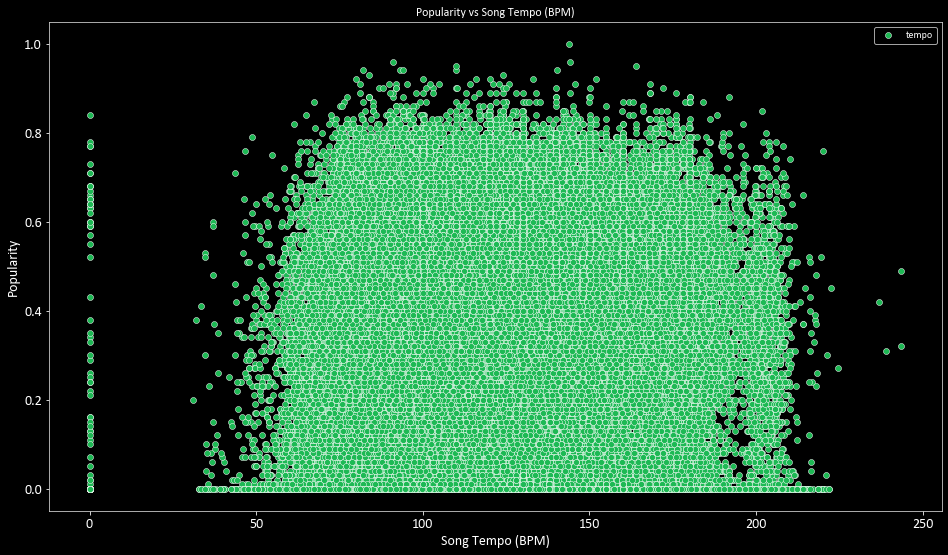

In [32]:
plt.figure(figsize=(16,9))

sns.scatterplot(x=df['tempo'], y=df['popularity'], label='tempo', color='#1DB954')
legend = plt.legend()
plt.setp(legend.get_texts(), color='w')

plt.title("Popularity vs Song Tempo (BPM)", color='w')
plt.ylabel("Popularity", fontsize=14)
plt.xlabel("Song Tempo (BPM)", fontsize=14)           
plt.tick_params(labelsize=14)
    
plt.show()

Not much of a clear trend between tempo and popularity, although we do see the majority of songs lying between 75 to 175 BPM.

### 3.1.5 Loudness

In [33]:
df.groupby('year').mean()['loudness']

year
1920   -12.261426
1921   -15.796558
1922   -19.275282
1923   -14.129211
1924   -14.183708
          ...    
2017    -7.981171
2018    -8.019460
2019    -8.438583
2020    -7.924402
2021    -9.784571
Name: loudness, Length: 102, dtype: float64

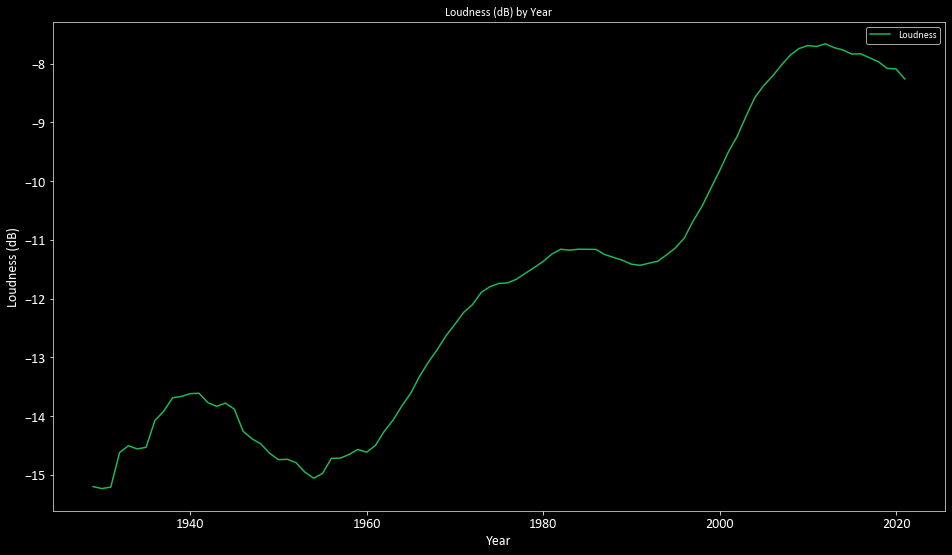

In [34]:
plt.figure(figsize=(16,9))

sns.lineplot(x=df.groupby('year').mean()['loudness'].index, y=df.groupby('year').mean()['loudness'].rolling(10).mean().values, label='Loudness', color='#1DB954')
legend = plt.legend()
plt.setp(legend.get_texts(), color='w')

plt.title("Loudness (dB) by Year", color='w')
plt.ylabel("Loudness (dB)", fontsize=14)
plt.xlabel("Year", fontsize=14)           
plt.tick_params(labelsize=14)
    
plt.show()

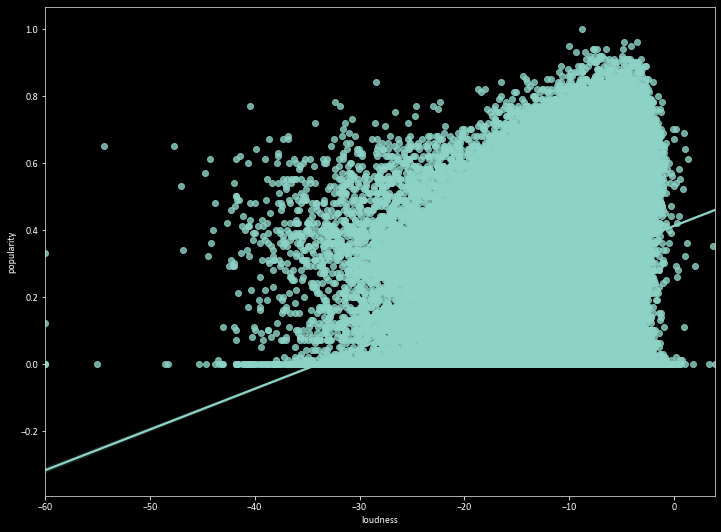

In [35]:
plt.figure(figsize=(12,9))

sns.regplot(x=df['loudness'], y=df['popularity']);

### 3.1.6 Duration of Song

In [36]:
df['duration_mins'].describe()

count    159477.000000
mean          3.693317
std           1.395648
min           0.080000
25%           2.810000
50%           3.430000
75%           4.360000
max           8.930000
Name: duration_mins, dtype: float64

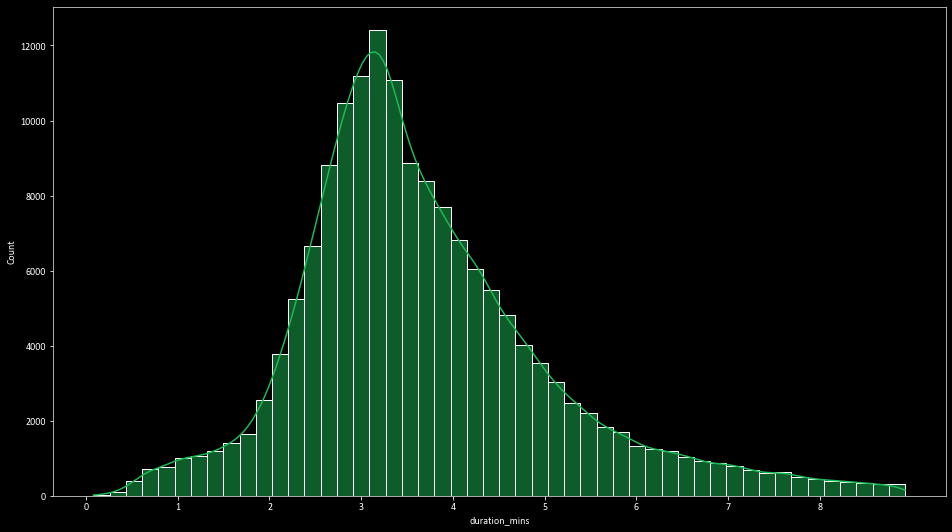

In [37]:
plt.figure(figsize=(16,9))

sns.histplot(df['duration_mins'], bins=50, kde=True,color='#1DB954')

plt.xticks(np.arange(0, 9, step=1))
plt.show()

In [38]:
round(df.groupby('year').mean()['duration_mins'], 2)

year
1920    3.36
1921    3.76
1922    2.76
1923    2.97
1924    3.04
        ... 
2017    3.75
2018    3.63
2019    3.58
2020    3.51
2021    3.49
Name: duration_mins, Length: 102, dtype: float64

In [39]:
df.groupby('year').mean().index

Int64Index([1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929,
            ...
            2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021],
           dtype='int64', name='year', length=102)

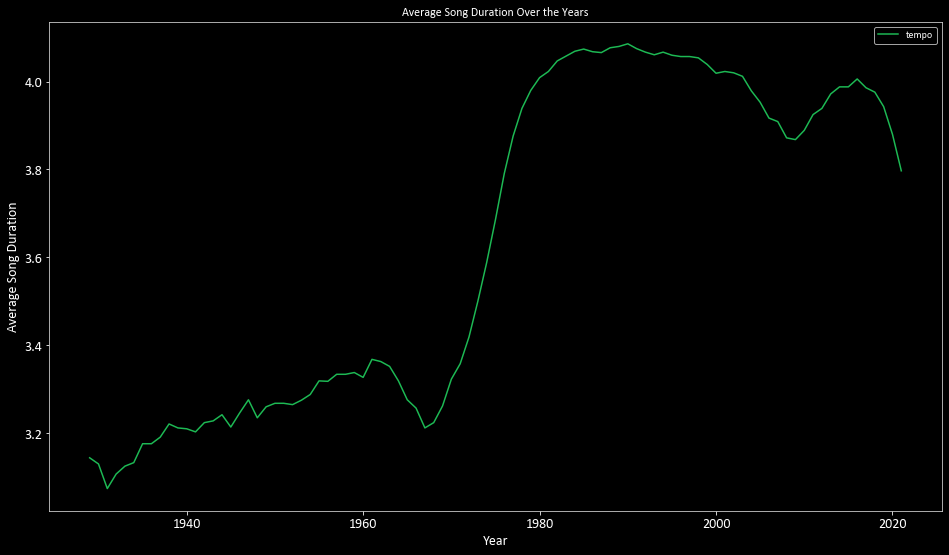

In [40]:
plt.figure(figsize=(16,9))

sns.lineplot(x=df.groupby('year').mean().index, y=round(df.groupby('year').mean()['duration_mins'], 2).rolling(10).mean(), label='tempo', color='#1DB954')
legend = plt.legend()
plt.setp(legend.get_texts(), color='w')

plt.title("Average Song Duration Over the Years", color='w')
plt.ylabel("Average Song Duration", fontsize=14)
plt.xlabel("Year", fontsize=14)           
plt.tick_params(labelsize=14)
    
plt.show()

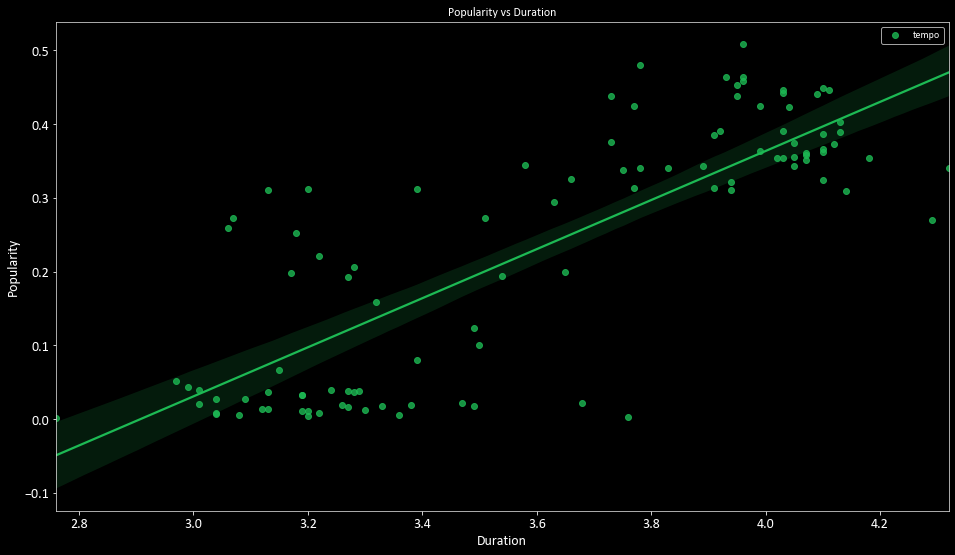

In [41]:
plt.figure(figsize=(16,9))

sns.regplot(x=round(df.groupby('year').mean()['duration_mins'], 2), y=df.groupby('year').mean()['popularity'], label='tempo', color='#1DB954')
legend = plt.legend()
plt.setp(legend.get_texts(), color='w')

plt.title("Popularity vs Duration", color='w')
plt.ylabel("Popularity", fontsize=14)
plt.xlabel("Duration", fontsize=14)           
plt.tick_params(labelsize=14)
    
plt.show()

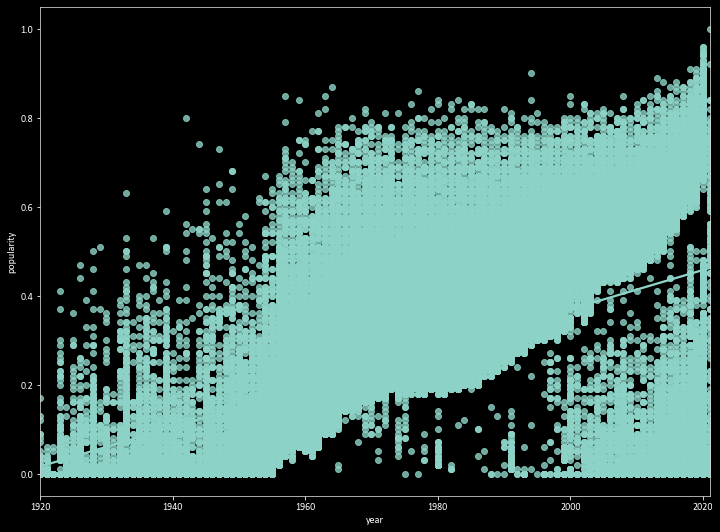

In [42]:
plt.figure(figsize=(12,9))
sns.regplot(x=df['year'], y=df['popularity'], ci=95);

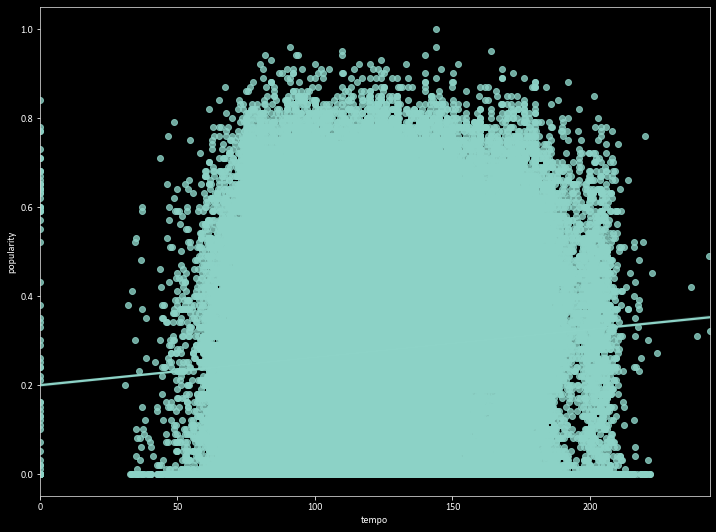

In [43]:
plt.figure(figsize=(12,9))

sns.regplot(x=df['tempo'], y=df['popularity']);

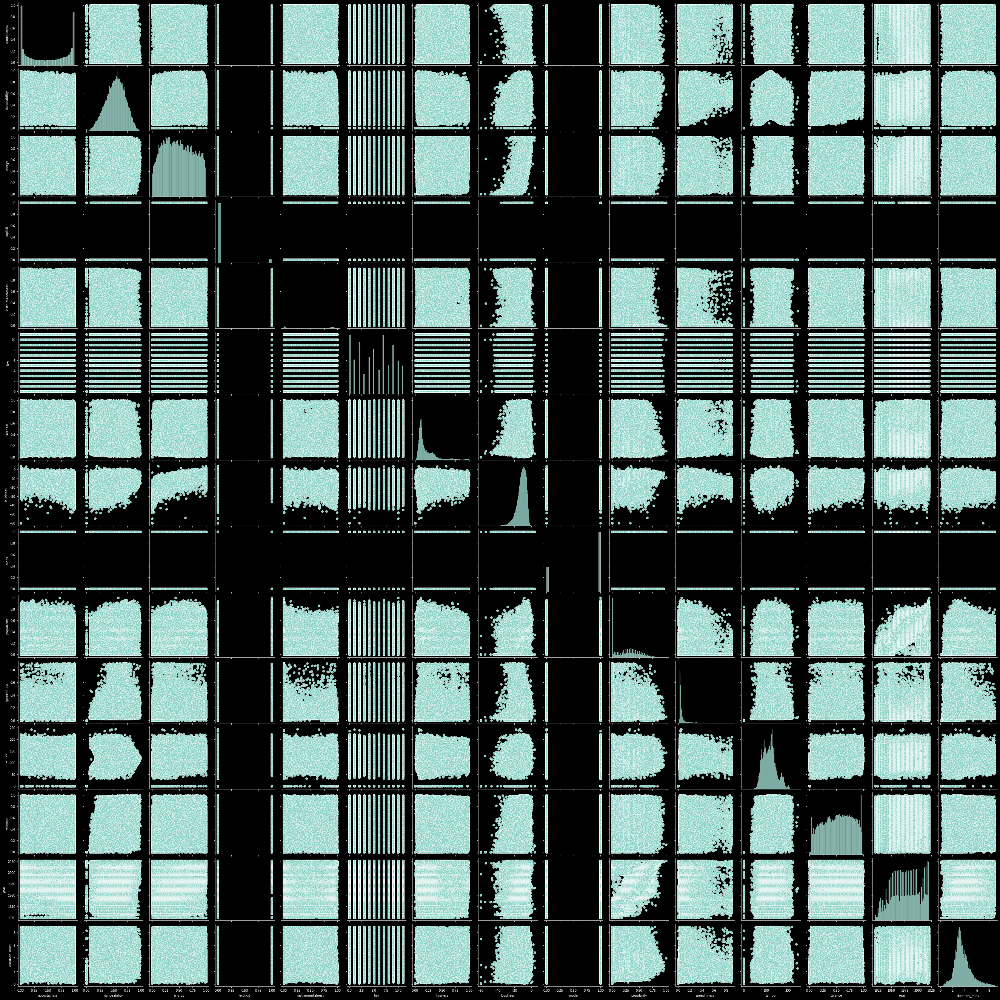

In [44]:
sns.pairplot(df)

In [45]:
df.columns

Index(['acousticness', 'artists', 'danceability', 'energy', 'explicit', 'id',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'name',
       'popularity', 'speechiness', 'tempo', 'valence', 'year',
       'duration_mins'],
      dtype='object')

## 3.2 Categorical Variables

In [46]:
categorical_variables = ['artists', 'explicit', 'key', 'mode', 'name']

In [47]:
df[categorical_variables].head()

,artists,explicit,key,mode,name
release_date,,,,,
1920-01-01,['Mamie Smith'],0,5,0,Keep A Song In Your Soul
1920-01-05,"[""Screamin' Jay Hawkins""]",0,5,0,I Put A Spell On You
1920-01-01,['Mamie Smith'],0,0,1,Golfing Papa
1920-01-01,['Oscar Velazquez'],0,2,1,True House Music - Xavier Santos & Carlos Gomi...
1920-10-01,['Mixe'],1,10,0,Xuniverxe


### 3.2.1 Song Explicit-ness 

In [48]:
df.groupby('year').mean()['explicit']

year
1920    0.138710
1921    0.079710
1922    0.000000
1923    0.000000
1924    0.000000
          ...   
2017    0.226820
2018    0.244668
2019    0.250233
2020    0.190302
2021    0.115578
Name: explicit, Length: 102, dtype: float64

##### Average Explicitness of Songs Over the Years

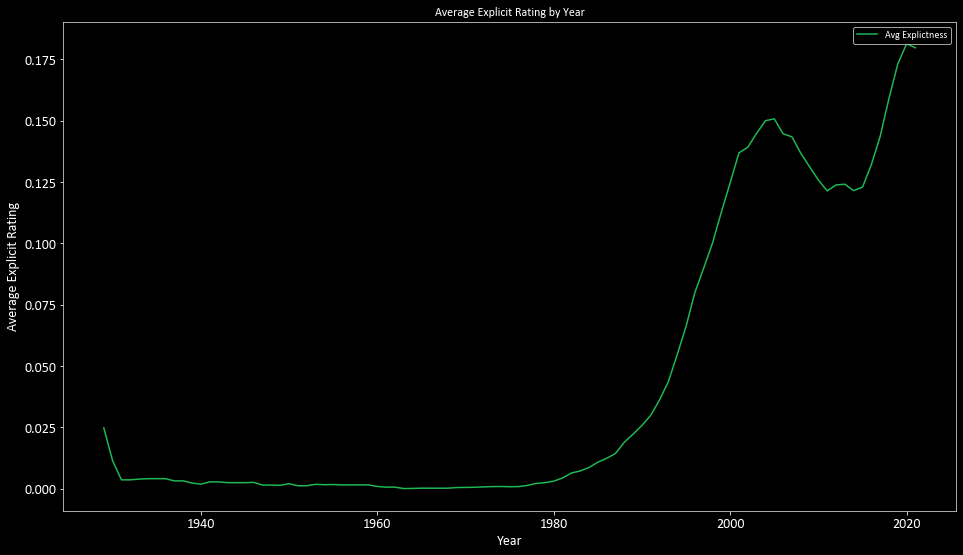

In [49]:
plt.figure(figsize=(16,9))

sns.lineplot(x=df.groupby('year').mean()['explicit'].index, y=df.groupby('year').mean()['explicit'].rolling(10).mean().values, label='Avg Explictness', color='#1DB954')
legend = plt.legend()
plt.setp(legend.get_texts(), color='w')

plt.title("Average Explicit Rating by Year", color='w')
plt.ylabel("Average Explicit Rating", fontsize=14)
plt.xlabel("Year", fontsize=14)           
plt.tick_params(labelsize=14)
    
plt.show()

Over time, we do observe the number of explicit songs increasing. This is likely due to increasing acceptance of swearing in songs and how swearing has become normalized due to social media. Another cause for this is due to the <a href="https://www.newsweek.com/songs-explicit-lyrics-popular-increase-billboard-spotify-583551">rise in streaming services</a>. Previously, the main medium for music to reach audiences and become popular was the radio, but that medium came with restrictions on the lyrical content of songs. Radio edits had to be made for music to be fit for radio listeners by censoring swear words or replacing them entirely. With streaming, listeners have the option to choose whether to listen to explicit songs, leaving artists with more freedom over their own music creations. 

##### Average Popularity of Explicit and Non-explicit Songs

In [50]:
df.groupby('explicit').mean()['popularity'].index

Int64Index([0, 1], dtype='int64', name='explicit')

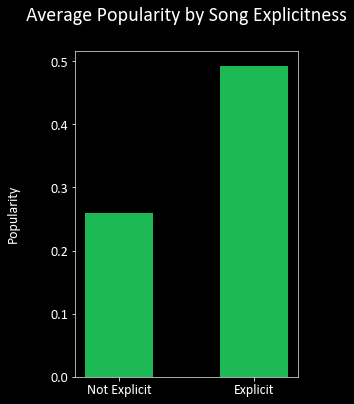

In [51]:
plt.figure(figsize=(4, 6))

ax = plt.bar(x=df.groupby('explicit').mean()['popularity'].index, height=df.groupby('explicit').mean()['popularity'], color='#1DB954', width=0.5)

plt.title("Average Popularity by Song Explicitness", color='w', fontsize=20, pad=30)
plt.ylabel("Popularity", fontsize=14, labelpad=30)
     
plt.tick_params(labelsize=14)

explicit_names = ('Not Explicit', 'Explicit')
y_pos = np.arange(len(explicit_names))
plt.xticks(y_pos, explicit_names)

plt.show()

On average, explicit songs are more popular. 

### 3.2.2 Key 

In [52]:
df['key'].value_counts()

0     20151
7     19935
2     17530
9     16661
5     15402
4     12388
1     11611
10    11328
8      9947
11     9660
6      8068
3      6796
Name: key, dtype: int64

In [53]:
key_names = ('C', 'C-sharp', 'D', 'D-sharp', 'E', 'F', 'F-sharp', 'G', 'G-sharp', 'A', 'B-flat', 'B')

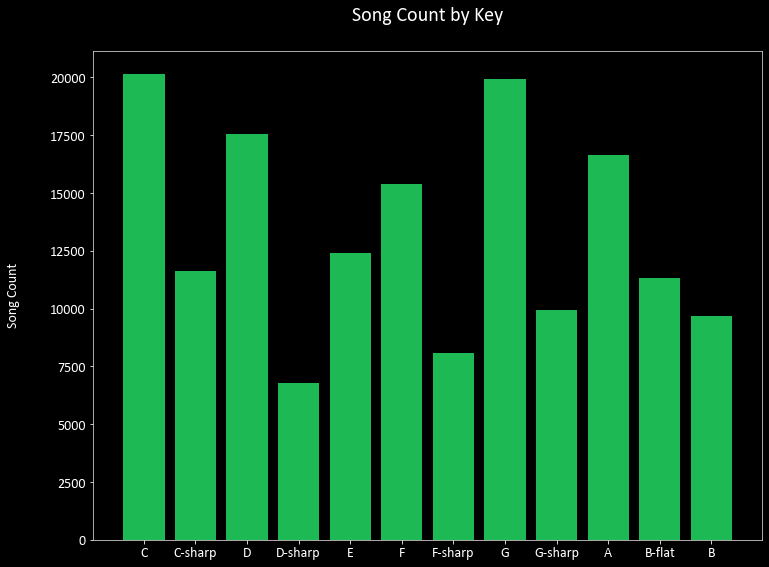

In [54]:
plt.figure(figsize=(12,9))

plt.bar(x=df['key'].value_counts().index, height=df['key'].value_counts().values, color='#1DB954')

plt.title("Song Count by Key", color='w', fontsize=20, pad=30)
plt.ylabel("Song Count", fontsize=14, labelpad=30)

y_pos = np.arange(len(key_names))
plt.xticks(y_pos, key_names)
     
plt.tick_params(labelsize=14)
plt.show()

The most common song keys are C, G, D and A. C and G are often considered the best keys for <a href="https://mixedinkey.com/captain-plugins/wiki/common-chord-progressions-pop-music/#:~:text=C%20major%20and%20G%20major,and%20scales%20for%20Pop%20music.">Pop music</a>. In addition, separate findings revealed that most Western contemporary music is based around either the piano or guitar, or both. Thus, bands who play the piano are more likely to play in the key of C (more convenient for piano), whereas those who play the guitar and piano tend to play in the key of G which is convenient for both these instruments (<a href="https://www.digitaltrends.com/music/whats-the-most-popular-music-key-spotify/">source</a>).

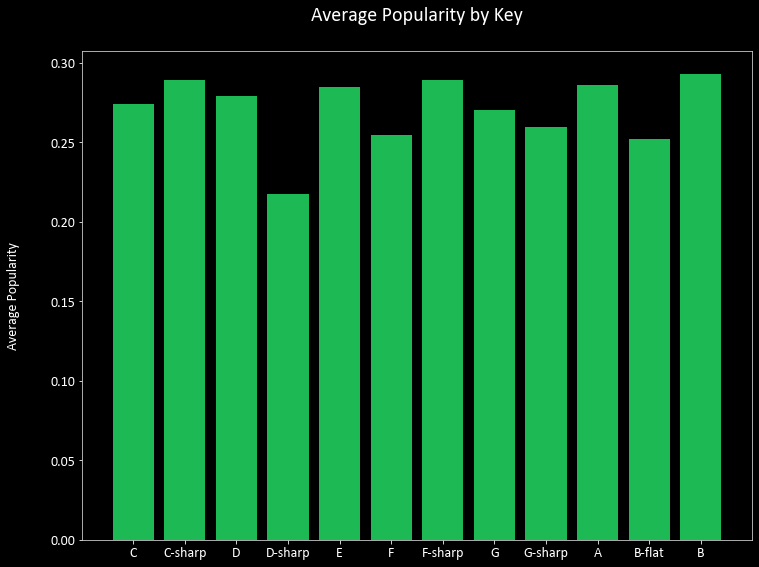

In [55]:
plt.figure(figsize=(12,9))

plt.bar(x=df.groupby('key').mean()['popularity'].index, height=df.groupby('key').mean()['popularity'].values, color='#1DB954')

plt.title("Average Popularity by Key", color='w', fontsize=20, pad=30)
plt.ylabel("Average Popularity", fontsize=14, labelpad=30)

y_pos = np.arange(len(key_names))
plt.xticks(y_pos, key_names)
     
plt.tick_params(labelsize=14)
plt.show()

The top 5 most popular keys are E, A, D, B and C. In general, we note that the range of popularity is roughly between 0.20 to 0.27, which suggests that song keys may not influence the popularity of songs much. 

### 3.2.3 Mode

In [56]:
df['mode'].value_counts()

1    112707
0     46770
Name: mode, dtype: int64

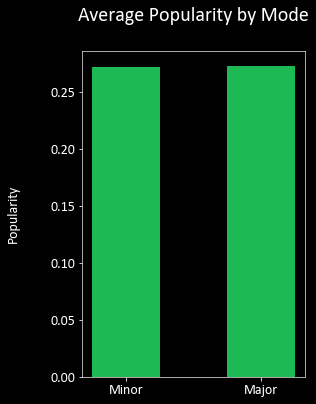

In [57]:
plt.figure(figsize=(4, 6))

ax = plt.bar(x=df.groupby('mode').mean()['popularity'].index, height=df.groupby('mode').mean()['popularity'], color='#1DB954', width=0.5)

plt.title("Average Popularity by Mode", color='w', fontsize=20, pad=30)
plt.ylabel("Popularity", fontsize=14, labelpad=30)

plt.tick_params(labelsize=14)

mode_names = ('Minor', 'Major')
y_pos = np.arange(len(mode_names))
plt.xticks(y_pos, mode_names)

plt.show()

Here we do not observe any massive differences in the popularity between songs with a major or minor modality, suggesting that songs released of either type are equally likely to be popular. 

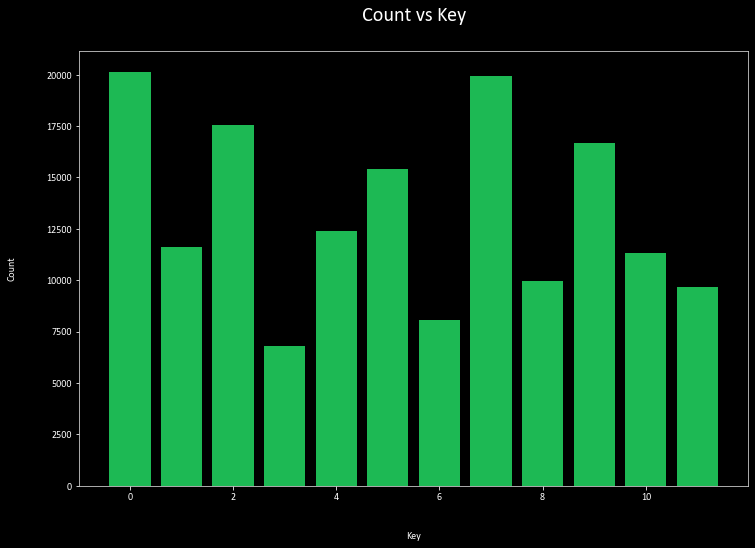

In [58]:
plt.figure(figsize=(12,8))

plt.bar(x=df['key'].value_counts().index, height=df['key'].value_counts().values, color= '#1DB954')
plt.xlabel("Key", labelpad=30)
plt.ylabel("Count", labelpad=30)

plt.title("Count vs Key", c='white', size=20, pad=30);

From the above plots and the correlation analyses conducted earlier, the features 'Key' and 'Mode' do not reveal a noticeable impact on song popularity. Thus, these features will be dropped from our dataset before the modelling process.

## 3.3 Most Popular Songs

In [59]:
df.columns

Index(['acousticness', 'artists', 'danceability', 'energy', 'explicit', 'id',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'name',
       'popularity', 'speechiness', 'tempo', 'valence', 'year',
       'duration_mins'],
      dtype='object')

In [60]:
top_50_songs = df.sort_values('popularity', ascending=False,)[['artists', 'name', 'popularity']].head(50)
top_50_songs

,artists,name,popularity
release_date,,,
2021-01-08,['Olivia Rodrigo'],drivers license,1.00
2020-07-24,"['24kGoldn', 'iann dior']",Mood (feat. iann dior),0.96
2020-10-30,['Ariana Grande'],positions,0.96
2020-10-23,['KAROL G'],BICHOTA,0.95
2020-10-30,"['Bad Bunny', 'Jhay Cortez']",DÁKITI,0.95
2020-11-06,['The Kid LAROI'],WITHOUT YOU,0.94
2020-08-20,['CJ'],Whoopty,0.94
2020-11-12,['Billie Eilish'],Therefore I Am,0.94
2020-10-30,['Ariana Grande'],34+35,0.94


In [61]:
# Sort songs by popularity in ascending order 
top_50_songs = top_50_songs.sort_values('popularity', ascending=True)

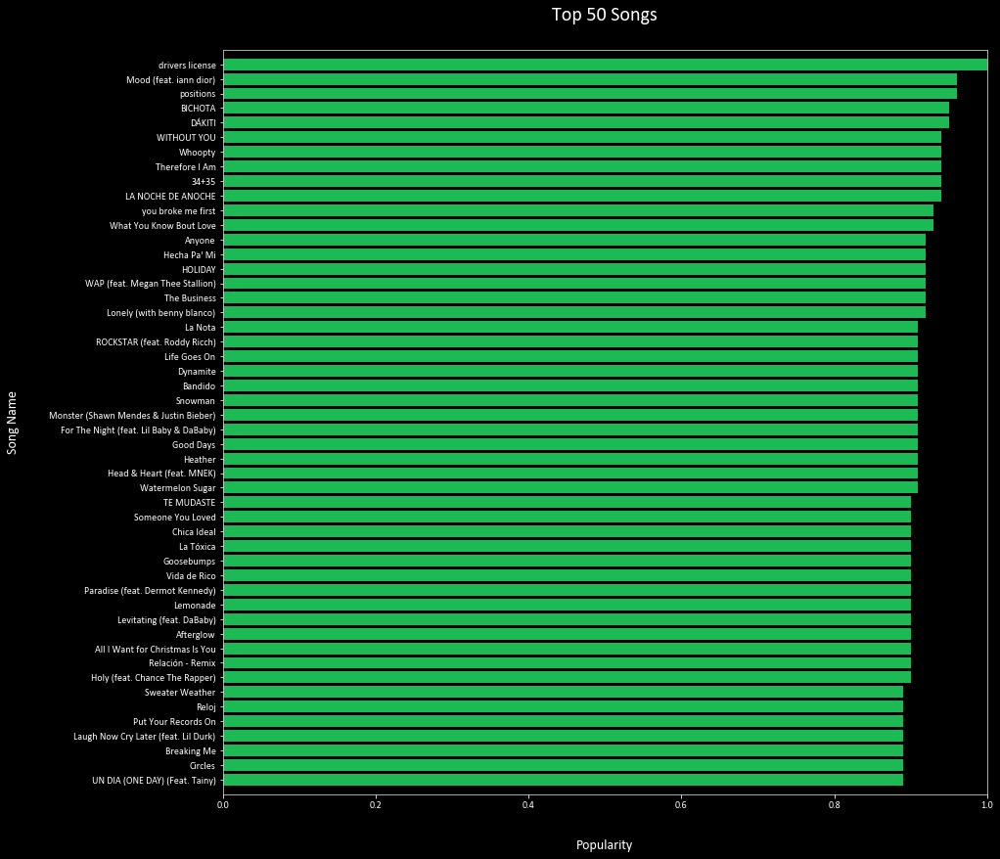

In [62]:
plt.figure(figsize=(14,14))

plt.barh(y=top_50_songs['name'], width=top_50_songs['popularity'], color= '#1DB954')
plt.xlabel("Popularity", fontsize=14, labelpad=30)
plt.ylabel("Song Name", fontsize=14, labelpad=30)

plt.ylim([-1,50])
plt.xlim([0,1])
plt.title("Top 50 Songs", fontsize=20, c='white', pad=30);

Above are the top 50 songs by popularity. There are indeed some of the more familiar names 
- WAP 
- Monster
- All I want for Christmas is you 
- Put your records on 
- Sweater Weather 

## 3.4 Most Popular Genres

In [63]:
df_genres = pd.read_csv("../datasets/data_by_genres_cleaned.csv")
df_genres.head()

,genres,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,duration_mins
0,21st century classical,0.754600,0.284100,0.159580,0.484374,0.168580,-22.153400,0.062060,91.351000,0.143380,0.066000,4,1,5.88
1,432hz,0.485515,0.312000,0.391678,0.477250,0.265940,-18.131267,0.071717,118.900933,0.236483,0.412000,11,1,17.46
2,8-bit,0.028900,0.673000,0.950000,0.630000,0.069000,-7.899000,0.292000,192.816000,0.997000,0.000000,5,1,2.22
3,[],0.535793,0.546937,0.485430,0.278442,0.220970,-11.624754,0.101511,116.068980,0.486361,0.123508,7,1,4.16
4,a cappella,0.694276,0.516172,0.330533,0.036080,0.222983,-12.656547,0.083627,105.506031,0.454077,0.390862,7,1,3.36


In [64]:
df_genres.shape

(3232, 14)

In [65]:
plt.figure(figsize=(14,14), dpi=600)

plt.barh(y=df_genres.sort_values('popularity')['genres'].tail(50), width=df_genres.sort_values('popularity')['popularity'].tail(50), color= '#1DB954')
plt.xlabel("Popularity", fontsize=16, labelpad=10)
plt.ylabel("Genres", fontsize=16, labelpad=10)

plt.ylim([-1,50])
plt.title("Top 50 Genres", fontsize=24, c='white', pad=20);

In [66]:
top_50_genres = df_genres.sort_values('popularity', ascending=False).head(50)
top_50_genres

,genres,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,duration_mins
565,chinese electropop,0.002570,0.660000,0.787000,0.000000e+00,0.323000,-4.592000,0.032000,142.018000,0.199000,0.790000,1,0,3.62
1768,korean mask singer,0.238000,0.658000,0.749000,2.030000e-06,0.272000,-2.967000,0.063400,128.909000,0.442000,0.780000,9,0,3.32
3213,yaoi,0.006550,0.603000,0.964000,3.040000e-06,0.143000,-2.886000,0.048700,135.028000,0.796000,0.770000,8,0,3.44
996,dutch rap pop,0.216000,0.767000,0.643000,1.040000e-04,0.080600,-5.225000,0.101000,169.990000,0.536000,0.770000,5,1,3.21
2544,rochester mn indie,0.034700,0.655000,0.487000,8.970000e-01,0.271000,-7.988000,0.033000,139.914000,0.045400,0.760000,6,1,3.43
945,dong-yo,0.259000,0.829000,0.886000,0.000000e+00,0.055900,-1.746000,0.112000,115.056000,0.777000,0.760000,8,1,1.35
44,afroswing,0.171333,0.758333,0.512000,3.273333e-05,0.101033,-7.562667,0.211000,102.061000,0.480333,0.753333,11,0,3.15
1616,j-rap,0.096100,0.648000,0.904000,2.070000e-06,0.062900,-4.565000,0.078600,121.994000,0.728000,0.750000,6,0,5.47
1066,estonian pop,0.285000,0.458000,0.696000,0.000000e+00,0.123000,-4.742000,0.040200,174.141000,0.418000,0.750000,11,1,3.45
1539,irish pop,0.308600,0.474750,0.513625,2.429470e-02,0.146075,-8.183875,0.057700,111.043375,0.265238,0.746250,7,1,3.54


## 3.5 Most Common Song Titles

In [67]:
df['name'].value_counts().head(21)

White Christmas                           102
Winter Wonderland                          88
Silent Night                               81
Jingle Bells                               71
Have Yourself a Merry Little Christmas     70
2000 Years                                 61
Sleigh Ride                                54
The Christmas Song                         51
Silver Bells                               51
Summertime                                 50
O Holy Night                               48
Overture                                   45
Happy New Year                             39
Ave Maria                                  37
Stay                                       34
Blue Christmas                             34
Hark! The Herald Angels Sing               34
Stardust                                   32
I Love You                                 31
Santa Claus Is Coming To Town              30
The First Noel                             29
Name: name, dtype: int64

In [68]:
plt.figure(figsize=(14,14), dpi=600)

plt.barh(y=df_genres.sort_values('popularity')['genres'].tail(50), width=df_genres.sort_values('popularity')['popularity'].tail(50), color= '#1DB954')
plt.xlabel("Popularity", fontsize=16, labelpad=10)
plt.ylabel("Genres", fontsize=16, labelpad=10)

plt.ylim([-1,50])
plt.title("Top 50 Genres", fontsize=24, c='white', pad=20);

Above we see the top 20 most common song titles. 

1) Although these songs have the same titles, an artist may have released multiple versions of the same song at different times of the year, either as a single, as an album, across multiple albums or with updated instrumentals. 

2) Different artists may release their own renditions of songs. This is especially true for Christmas-related songs such as 'White Christmas' where over 103 versions exist on Spotify. Reasons why artists may do this is to gain more exposure, satisfy their listeners or purely for financial reasons! Christmas albums are one of the biggest <a href="https://www.marketplace.org/2020/12/23/what-makes-christmas-music-so-lucrative/">cash cows</a> of all time, despite being relevant for 1-2 months a year. 

 A classic example of this is Mariah Carey's "All I want for Christmas is you" which is among the top 50 most popular songs. As the <a href="https://www.marketplace.org/2020/12/23/what-makes-christmas-music-so-lucrative/">performer, co-writer and co-producer of the song</a>, her festive track generates revenue for her in 3 different ways, amounting to over <a href="https://www.economist.com/graphic-detail/2017/11/30/the-music-industry-should-be-dreaming-of-a-white-christmas">USD 60 million</a> since its release in 1994. 

3) Artists may use the same title for their songs, despite them being completely different 

4) We also note that with high Nostalgic reasons

Overture is defined as <a href="https://www.britannica.com/art/overture-music">"an orchestral introduction to a musical work (often dramatic), but also an independent instrumental work."</a> Thus we see multiple artists titling their compositions as "Overture", with several notable soundtracks containing this title, eg. Halo, Beauty & the Beast, and most notably Phantom of the Opera.    



### 3.6 Top Artists

In [69]:
top_50_artists = pd.DataFrame(df.artists.value_counts().sort_values(ascending=False).head(50))
top_50_artists.rename(columns={'artists': 'song_count'}, inplace=True)
top_50_artists.head()

,song_count
['Francisco Canaro'],951
['Ignacio Corsini'],624
['Frank Sinatra'],617
['Elvis Presley'],493
"['Francisco Canaro', 'Charlo']",456


In [70]:
top_50_artists = top_50_artists.sort_values(by='song_count', ascending=True)
top_50_artists.head()

,song_count
"['Billie Holiday', 'Teddy Wilson']",181
['KISS'],182
['Armin van Buuren'],182
['Count Basie'],183
['Shamshad Begum'],183


In [71]:
plt.figure(figsize=(14,14), dpi=600)

plt.barh(y=top_50_artists.index, width=top_50_artists['song_count'].values, color= '#1DB954')
plt.xlabel("Popularity", fontsize=14, labelpad=30)
plt.ylabel("Artists", fontsize=14, labelpad=30)

plt.ylim([-1,50])
plt.title("Top 50 Artists", fontsize=20, c='white', pad=30);
